In [1]:
import matplotlib.pyplot as plt
import mdtraj as md
import numpy as np
import py3Dmol
from Bio.PDB import PDBParser, Superimposer, PDBIO
from deeptime.markov.msm import MarkovStateModel
from Bio.SVDSuperimposer import SVDSuperimposer
from numpy import array, dot, set_printoptions
from scipy.spatial.distance import cdist
from deeptime.decomposition import TICA
from mpl_toolkits.mplot3d import Axes3D 
from sklearn.cluster import KMeans
from copy import deepcopy
from io import StringIO

In [2]:
# Load trajectory
traj = md.load('fbp_apo.dcd', top='fbp_apo.psf')

# Dihedral features (phi, psi)
phi_angles, _ = md.compute_phi(traj)
psi_angles, _ = md.compute_psi(traj)
dihedral_data = np.concatenate([phi_angles, psi_angles], axis=1)

# Frames info
print("Frames:", traj.n_frames)  # should print ~10000

# 1 frame = 0.1 ns = 100 ps
dt_ps = 100.0  

# tICA lagtime = 2 ns = 2000 ps = 20 frames
lag_tica_frames = 100
print("tICA lagtime (frames):", lag_tica_frames)

# Run tICA
tica_model = TICA(lagtime=lag_tica_frames, dim=4)
tica_model.fit(dihedral_data)
tica_traj = tica_model.transform(dihedral_data)
print("tICA projection shape:", tica_traj.shape)

Frames: 10000
tICA lagtime (frames): 100
tICA projection shape: (308, 4)


In [3]:
# Define the number of clusters (microstates) to assign in the tICA space.
n_clusters = 150

# Initialize the KMeans object with the desired number of clusters.
kmeans = KMeans(n_clusters=n_clusters, random_state=42)

# Fit KMeans to the tICA-projected data and get discrete state assignments for each frame.
state_labels = kmeans.fit_predict(tica_traj)

# Print the shape of the cluster label array (should match the number of trajectory frames).
print("Cluster labels shape:", state_labels.shape)

Cluster labels shape: (308,)


In [4]:
# Function to compute a transition matrix from discrete state labels.
def transition_matrix_from_labels(labels, lag_frames, n_states=None):
    if n_states is None:
        n_states = int(np.max(labels)) + 1 
    C = np.zeros((n_states, n_states), dtype=float) 
    for i in range(len(labels) - lag_frames):
        C[labels[i], labels[i + lag_frames]] += 1.0
    row_sums = C.sum(axis=1, keepdims=True)  
    T = np.divide(C, np.maximum(row_sums, 1.0), out=np.zeros_like(C), where=row_sums > 0)
    zero_rows = (row_sums.squeeze() == 0)
    if np.any(zero_rows):
        T[zero_rows] = 1.0 / n_states
    return T

# Function to compute implied timescales from eigenvalues.
def implied_timescales_from_eigs(evals, lag_ns, top_k=4):
    lam = np.sort(np.real(evals))[::-1] 
    lam = lam[1:top_k+1]  
    its = []
    for l in lam:
        if (l <= 0) or (l >= 1): 
            its.append(np.nan)
        else:
            its.append(lag_ns / (-np.log(l)))
    return np.array(its)

# Define lag times in nanoseconds and corresponding frame units.
lags_ns = [5, 8, 10, 13, 15]
lags_frames = [50, 80, 100, 130, 150]  # 1 frame = 0.1 ns

all_its = []  # Store implied timescales for each lag
msms = []     # Store MSM models

# Loop over each lag time to build MSM and compute implied timescales.
for lag_frames, lag_ns in zip(lags_frames, lags_ns):
    T = transition_matrix_from_labels(state_labels, lag_frames, n_states=n_clusters)
    msm = MarkovStateModel(T, lagtime=lag_frames)
    msms.append(msm)
    evals, _ = np.linalg.eig(msm.transition_matrix)
    all_its.append(implied_timescales_from_eigs(evals, lag_ns=lag_ns, top_k=4))

# Convert list of timescales to NumPy array for plotting or analysis.
all_its = np.array(all_its)

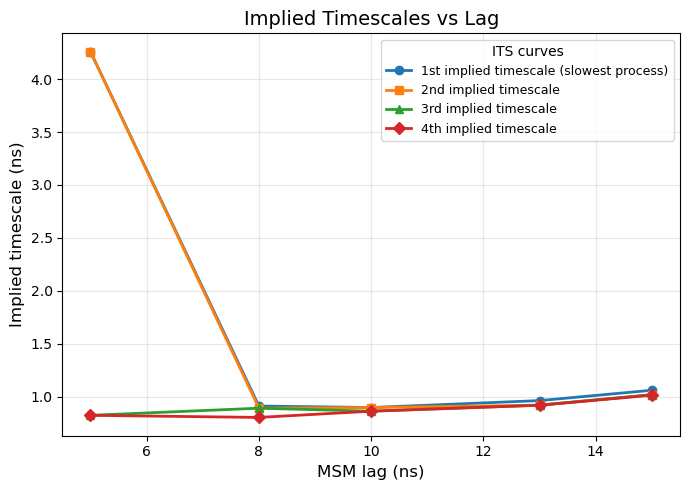

In [5]:
# Visualization of Implied Timescales vs Lag
plt.figure(figsize=(7,5))

markers = ['o', 's', '^', 'D']
colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
labels = [
    '1st implied timescale (slowest process)',
    '2nd implied timescale',
    '3rd implied timescale',
    '4th implied timescale'
]

for k in range(all_its.shape[1]):
    plt.plot(
        lags_ns, 
        all_its[:, k], 
        marker=markers[k], 
        color=colors[k], 
        label=labels[k],
        linewidth=2
    )

plt.xlabel('MSM lag (ns)', fontsize=12)
plt.ylabel('Implied timescale (ns)', fontsize=12)
plt.title('Implied Timescales vs Lag', fontsize=14)
plt.legend(title="ITS curves", fontsize=9, title_fontsize=10)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [6]:
# Choose lag index based on ITS plot.
# Select the lag time at which the implied timescales start to converge (i.e., the plot becomes flat/plateaus).
# This indicates the model is becoming Markovian at that lag time.
chosen_idx = 2  # example: if you pick 10 ns (i.e., lag_ns[2]), then chosen_idx is 2

msm_model = msms[chosen_idx]
print(f"Chosen MSM lag: {lags_ns[chosen_idx]} ns")

print("\nTransition Matrix shape:", msm_model.transition_matrix.shape)
print(msm_model.transition_matrix)

print("\nStationary Distribution (π):")
print(msm_model.stationary_distribution)

eigenvalues, _ = np.linalg.eig(msm_model.transition_matrix)
print("\nEigenvalues of MSM:")
print(eigenvalues)

Chosen MSM lag: 10 ns

Transition Matrix shape: (150, 150)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.00666667 0.00666667 0.00666667 ... 0.00666667 0.00666667 0.00666667]
 [0.00666667 0.00666667 0.00666667 ... 0.00666667 0.00666667 0.00666667]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]

Stationary Distribution (π):
[0.00686076 0.01134664 0.01155774 0.00633301 0.00316651 0.00844401
 0.00369426 0.01332571 0.00474976 0.00316651 0.0135632  0.00316651
 0.00316651 0.00818014 0.00686076 0.00316651 0.00316651 0.00316651
 0.00881344 0.00580526 0.00928988 0.00316651 0.01431524 0.01710793
 0.00818014 0.00567332 0.01011523 0.00316651 0.01847128 0.00957868
 0.01259565 0.00316651 0.00606914 0.00567332 0.00316651 0.02794881
 0.00395813 0.00738851 0.00379981 0.00316651 0.0171994  0.0066496

In [7]:
# Option A: highest stationary probability
pi = np.real(msm_model.stationary_distribution)
target_cluster_A = int(np.argmax(pi))
print("Target cluster by highest π:", target_cluster_A)

# Option B: extreme along tIC1
tic_axis = 0
cluster_means = np.vstack([
    tica_traj[state_labels == c].mean(axis=0) if np.any(state_labels == c) else np.full(tica_traj.shape[1], np.nan)
    for c in range(n_clusters)
])
target_cluster_B = int(np.nanargmax(cluster_means[:, tic_axis]))
print("Target cluster by tIC extreme:", target_cluster_B)

# Choose one
target_cluster = target_cluster_A
print("Using target cluster:", target_cluster)

# Representative frame
cluster_indices = np.where(state_labels == target_cluster)[0]
center = kmeans.cluster_centers_[target_cluster].reshape(1, -1)
distances = cdist(tica_traj[cluster_indices], center)
rep_idx = cluster_indices[np.argmin(distances)]
print("Representative frame index:", rep_idx)

# Save
rep_frame = traj[rep_idx]
rep_frame.save_pdb("predicted_conformation.pdb")
print("Saved representative structure to predicted_conformation.pdb")

Target cluster by highest π: 35
Target cluster by tIC extreme: 22
Using target cluster: 35
Representative frame index: 307
Saved representative structure to predicted_conformation.pdb


RMSD: 1.1940608183924126


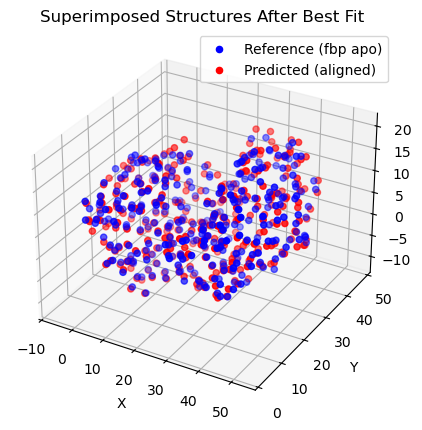

In [8]:
# Initialize the PDB parser.
parser = PDBParser(QUIET=True)

# Load the structures.
structure_ref = parser.get_structure("ref", "fbp_apo.pdb")
structure_pred = parser.get_structure("pred", "predicted_conformation.pdb")

# Function to extract CA atoms from a structure.
def get_ca_atoms(structure):
    ca_atoms = []
    for model in structure:
        for chain in model:
            for residue in chain:
                if "CA" in residue:
                    ca_atoms.append(residue["CA"])
    return ca_atoms

# Extract CA atoms from both structures.
ref_atoms = get_ca_atoms(structure_ref)
pred_atoms = get_ca_atoms(structure_pred)

# Ensure both structures have the same number of CA atoms.
if len(ref_atoms) != len(pred_atoms):
    raise ValueError("The number of CA atoms in the two structures do not match.")

# Perform the superimposition.
sup = Superimposer()
sup.set_atoms(ref_atoms, pred_atoms)
# Apply the transformation to the predicted structure.
sup.apply(structure_pred.get_atoms())

print("RMSD:", sup.rms)

# Extract coordinates for plotting.
ref_coords = np.array([atom.get_coord() for atom in ref_atoms])
pred_coords = np.array([atom.get_coord() for atom in pred_atoms])

# Create a 3D scatter plot.
fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection='3d')

# Plot reference structure coordinates (blue) and predicted (red).
ax.scatter(ref_coords[:, 0], ref_coords[:, 1], ref_coords[:, 2], 
           c='blue', label='Reference (fbp apo)')
ax.scatter(pred_coords[:, 0], pred_coords[:, 1], pred_coords[:, 2], 
           c='red', label='Predicted (aligned)')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title("Superimposed Structures After Best Fit")
ax.legend()

plt.show()

In [9]:
# Helper functions
parser = PDBParser(QUIET=True)
io = PDBIO()

# Extract CA atoms from a structure for alignment.
def get_ca_atoms(structure):
    ca_atoms = []
    for model in structure:
        for chain in model:
            for residue in chain:
                if "CA" in residue:
                    ca_atoms.append(residue["CA"])
    return ca_atoms

# Convert a Bio.PDB structure into PDB-format string.
def structure_to_string(structure):
    s = StringIO()
    io.set_structure(structure)
    io.save(s)
    return s.getvalue()

# Return a copy of structure_pred aligned to structure_ref and the RMSD of the alignment.
def superimpose_copy(structure_ref, structure_pred):
    pred_copy = deepcopy(structure_pred)
    ref_atoms = get_ca_atoms(structure_ref)
    pred_atoms = get_ca_atoms(pred_copy)
    
    sup = Superimposer()
    sup.set_atoms(ref_atoms, pred_atoms)
    sup.apply(pred_copy.get_atoms())
    return pred_copy, sup.rms

# Load structures
structure_apo  = parser.get_structure("ref_apo",  "fbp_apo.pdb")
structure_holo = parser.get_structure("ref_holo", "fbp_holo.pdb")
structure_pred = parser.get_structure("pred",     "predicted_conformation.pdb")

# Perform alignments
pred_on_apo,  rmsd_apo  = superimpose_copy(structure_apo,  structure_pred)
pred_on_holo, rmsd_holo = superimpose_copy(structure_holo, structure_pred)

print(f"RMSD (pred → apo):  {rmsd_apo:.3f} Å")
print(f"RMSD (pred → holo): {rmsd_holo:.3f} Å")

# Visualization 1: apo reference vs predicted aligned to apo.
view_apo = py3Dmol.view(width=300, height=250)

view_apo.addModel(structure_to_string(structure_apo),  'pdb')   # apo reference
view_apo.addModel(structure_to_string(pred_on_apo),    'pdb')   # predicted aligned to apo
view_apo.setStyle({'model': 0}, {'cartoon': {'color': 'blue'}})   # apo in blue
view_apo.setStyle({'model': 1}, {'cartoon': {'color': 'red'}})    # pred in red
view_apo.addLabel(f"apo reference\nRMSD = {rmsd_apo:.2f} Å",
                  {'position': {'x':0,'y':0,'z':0}, 
                   'backgroundOpacity': 0.5, 'fontSize': 12})
view_apo.zoomTo()
view_apo.show()

# Visualization 2: holo reference vs predicted aligned to holo.
view_holo = py3Dmol.view(width=300, height=250)
view_holo.addModel(structure_to_string(structure_holo), 'pdb')   # holo reference
view_holo.addModel(structure_to_string(pred_on_holo),   'pdb')   # predicted aligned to holo
view_holo.setStyle({'model': 0}, {'cartoon': {'color': 'green'}}) # holo in green
view_holo.setStyle({'model': 1}, {'cartoon': {'color': 'orange'}})# pred in orange
view_holo.addLabel(f"holo reference\nRMSD = {rmsd_holo:.2f} Å",
                   {'position': {'x':0,'y':0,'z':0}, 
                    'backgroundOpacity': 0.5, 'fontSize': 12})
view_holo.zoomTo()
view_holo.show()

RMSD (pred → apo):  1.194 Å
RMSD (pred → holo): 2.876 Å


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [10]:
pred_pdb    = "predicted_conformation.pdb"   # P
initial_pdb = "fbp_apo.pdb"           # I
target_pdb  = "fbp_holo.pdb"        # T

# Read C-alpha atom coordinates from a PDB file and return them as a NumPy array.
def read_ca_coords(pdb):
    xs = []
    with open(pdb) as f:
        for line in f:
            if line.startswith("ATOM") and line[12:16] == " CA ":
                xs.append([float(line[30:38]), float(line[38:46]), float(line[46:54])])
    return np.asarray(xs, float)

# Compute the cosine overlap (cosine similarity) between two vectors.
def overlap_cos(a, b):
    num = float(a @ b)
    den = np.sqrt(float(a @ a) * float(b @ b))
    return num / den if den != 0.0 else np.nan

# Superimpose two sets of coordinates using SVD and return the transformed coordinates and RMSD.
def superposer(value_x, value_y):
    x = np.array(value_x , 'f')
    y = np.array(value_y, 'f')
    superpose = SVDSuperimposer()
    superpose.set(x, y)
    superpose.run()
    rms = superpose.get_rms()
    rot, tran = superpose.get_rotran()
    initial_on_final = dot(y, rot) + tran
    initial_on_final_2 = superpose.get_transformed()
    return initial_on_final,rms

# Read CA coordinates.
P = read_ca_coords(pred_pdb)   # predicted
T = read_ca_coords(target_pdb) # target (reference frame)
I = read_ca_coords(initial_pdb)# initial

# Truncate to common length.
n = min(len(P), len(T), len(I))
P, T, I = P[:n], T[:n], I[:n]

# Superimpose
# Align P to T
P_aln, rmsP = superposer(T, P)   
# Align I to T
I_aln, rmsI = superposer(T, I)  

# Compute the two desired deltaR vectors: (P - T) and (I - T).
delta_PT = (P_aln - T).reshape(-1)
delta_IT = (I_aln - T).reshape(-1)

# Cosine similarity
O = overlap_cos(delta_PT, delta_IT)
print(f"CA count (N): {n}")
print(f"RMSD(P→T): {rmsP:.3f} Å, RMSD(I→T): {rmsI:.3f} Å")
print(f"O (cosine overlap P−T vs I−T): {O:.6f}")
print(f"O (percent): {O*100:.2f}%")

CA count (N): 309
RMSD(P→T): 2.876 Å, RMSD(I→T): 2.480 Å
O (cosine overlap P−T vs I−T): 0.910894
O (percent): 91.09%
